In [1]:
# using CDMS-V05-02 kernel

from sklearn.decomposition import PCA
import numpy as np
from cats.cdataframe import CDataFrame 
from os.path         import exists
from ROOT            import TCanvas
import ROOT

from cats             import importcpp
from CDMSDataCatalog  import CDMSDataCatalog
from cdmsvista.viewer import organize_raw_pulses_root, plot_raw
from supercuts        import ledOn_old

import matplotlib.pyplot as plt
import numpy             as np
from scipy.optimize import curve_fit

import rawio
from scipy.signal import butter, lfilter
from scipy.optimize import minimize
import re

%jsroot on

ModuleNotFoundError: No module named 'sklearn'

In [2]:
chanNames=["PAS1","PBS1","PCS1","PDS1","PES1","PFS1","PAS2","PBS2","PCS2","PDS2","PES2","PFS2"]

In [3]:
def get_df(dataDir, series):
    """
    Get df from a series. No cuts applied(?)

    Parameters:
    dataDir: directory path
    series: series name

    Returns:
    data frame

    """
    #filepath = f"{dataDir}/Prompt_V04-15_P0.2.1_{series}.root"

    filepath = "/sdf/scratch/users/y/yanliu/data/cute/public/Ge_public_plot_20240127.root"
    #filepath = "~/Ge_public_plot_20240127.root"

    
    print (filepath)

    # One CDataframe per detector, identified by detector number (1-6)
    dfs_orig = {
        det: CDataFrame(f"rqDir/zip{det}", filepath, [f"{filepath}:rqDir/eventTree"])
        for det in range(1, 6+1)
    }

    return dfs_orig

In [4]:
def butter_lowpass_filter(data, cutoff_frequency, sampling_rate=625000, order=4): # cutoff_frequency in kHz
    cutoff_frequency *= 1000
    nyquist = 0.5 * sampling_rate
    normal_cutoff = cutoff_frequency / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = lfilter(b, a, data)
    return y

In [5]:
def plot_raw_traces(events, det, chanNames=["PAS1","PBS1","PCS1","PDS1","PES1","PFS1","PAS2","PBS2","PCS2","PDS2","PES2","PFS2"], 
                    plot_title="", zoom=True, tracelength=32768, filter = "butter",
                    low_bound=15000, up_bound=20000, sampling_interval=1/625):
    """
    Plot raw traces from a rawio event object.

    Parameters:
    - events: event object from RawDataReader.read_events()
    - det: which detector
    - chanNames: list of channel names
    - plot_title: title of the plot, default left empty
    - zoom: whether to use zoom-in version (23 to 32 ms) or full tracelength
    - tracelength: 32768 hardcode??
    - filter: avaialble ones: butter or none. 
    - low_bound: lower bound for the plot
    - up_bound: upper bound for the plot
    - sampling_interval: time between samples

    Returns:
    - matplotlib plot(?)
    """
    pt_events = []
    use_default_title = True

    if not zoom:
        low_bound = 0
        up_bound = tracelength

    if len(plot_title)!=0:
        use_default_title = False
        

    time = np.arange(0, tracelength * sampling_interval, sampling_interval)

    for id in range(len(events)):
        #print (id)
        traces = events[id]["Z"+str(det)]

        plt.figure(figsize=(10, 4))
        if use_default_title:    
            plot_title="Raw traces for "+str(events[id]["event"]["SeriesNumber"])+" event "+str(events[id]["event"]["EventNumber"])            
        plt.title(plot_title)

        pt = np.zeros(tracelength)
        ctr = 0

        for chan in chanNames:
            pt += traces[chan]
            ctr += 1
            if (filter=="butter"):
                plt.plot(time[low_bound:up_bound], butter_lowpass_filter(traces[chan], 10)[low_bound:up_bound], label=chan, linewidth=1)
            elif (filter=="none"):
                plt.plot(time[low_bound:up_bound], traces[chan][low_bound:up_bound], label=chan, linewidth=1)
            else:
                print("unknown filter")

        pt /= ctr
        pt_events.append(pt)

        plt.xlabel("Time (ms)")
        plt.ylabel("ADC count")
        plt.legend()
        plt.show()

    return pt_events  # You might want to return something meaningful here

In [6]:
# double exponential function to mimic the pulse
samplerate = 625000.

def two_exp_fit(x, amp1, t1, t2, baseline, pretrigger):
    y = np.where(x <= pretrigger, baseline, -(amp1 * np.exp(-(x-pretrigger) / t1 /samplerate) - amp1 * np.exp(-(x-pretrigger) / t2/samplerate)) + baseline)
    return y

# triple exponential function to mimic the pulse
def three_exp_fit(x, amp1, amp2, t1, t2, t3, baseline, pretrigger):
    y = np.where(x <= pretrigger, baseline, -((amp1+amp2) * np.exp(-(x-pretrigger) / t1 /samplerate) - amp1 * np.exp(-(x-pretrigger) / t2/samplerate) - amp2 * np.exp(-(x-pretrigger) / t3/samplerate)) + baseline)
    return y

# quadraple exponential function to mimic the pulse
def four_exp_fit(x, amp1, amp2, amp3, t1, t2, t3, t4, baseline, pretrigger):
    y = np.where(x <= pretrigger, baseline, -((amp1+amp2+amp3) * np.exp(-(x-pretrigger) / t1 /samplerate) - amp1 * np.exp(-(x-pretrigger) / t2/samplerate) - amp2 * np.exp(-(x-pretrigger) / t3/samplerate) - amp3 * np.exp(-(x-pretrigger) / t4/samplerate)) + baseline)
    return y

In [7]:
# Figure out data directory
rootDir_s3df = "/fs/ddn/sdf/group/supercdms"
rootDir_drac = "/project/rrg-mdiamond"
relDir       = "/data/CDMS/CUTE/R37/Processed/Prompt/Prompt_V04-15_P0.2.1/Submerged"

if   exists(rootDir_s3df): dataDir = rootDir_s3df + relDir
elif exists(rootDir_drac): dataDir = rootDir_drac + relDir
else: raise Exception("Couldn't find data directory?  Are you not on S3DF or ComputeCanada?")

In [8]:
#series = "23231219_034952"

#filepath = f"{dataDir}/Prompt_V04-15_P0.2.1_{series}.root"


det = 1
series = "Ge_public_plot_20240127"
df = get_df(dataDir, series)

/sdf/scratch/users/y/yanliu/data/cute/public/Ge_public_plot_20240127.root


In [9]:
df

{1: <cppyy.gbl.ROOT.RDataFrame object at 0x563d9525e060>,
 2: <cppyy.gbl.ROOT.RDataFrame object at 0x563d9545c200>,
 3: <cppyy.gbl.ROOT.RDataFrame object at 0x563d953c7920>,
 4: <cppyy.gbl.ROOT.RDataFrame object at 0x563d9527ff00>,
 5: <cppyy.gbl.ROOT.RDataFrame object at 0x563d953c8540>,
 6: <cppyy.gbl.ROOT.RDataFrame object at 0x563d95408340>}

In [10]:
# Making timestamps relative to start of series, not 1970
def t0(df): return df.Filter("rdfentry_ == 1").AsNumpy(["EventTime"])["EventTime"][0]

df[det] = df[det].Define("EventTime_rel",f"EventTime-{t0(df[det])}")

In [11]:
# select only physics trigger event. chisq shouldn't cut anything (other than -999999 events)
df[det] = df[det].Filter("PTOFchisq > 0")\
                 .Filter("EventType == 1")

In [12]:
%jsroot on

c_time = TCanvas("c_time", "", 1000, 500)

graphs_time = {}
    #if det == 2:
        #continue;
c_time.SetLogy()
df_cut = df[det].Filter("TriggerDetectorNum == " + str(det))
graphs_time[det] = df_cut.Graph("EventTime_rel", "PTOFamps")
    #graphs_time[det].SetTitle(f"Series {series} Detector {det} Amplitude;Time (s);Amplitude (A)")
graphs_time[det].SetTitle(f"Ge activation peaks in Detector {det} PTOFamps vs. Time (trigtype&trigdet&timeperiod cuts);Time (s);Amplitude (A)")
graphs_time[det].GetYaxis().SetRangeUser(1e-8,3e-4)
graphs_time[det].SetMarkerStyle(ROOT.kFullDotSmall)
graphs_time[det].Draw("AP")

c_time.Draw()

In [13]:
# Let's select events at 1.3 keV, by hand-picking the amplitudes

df_cut = df[det].Filter("TriggerDetectorNum == " + str(det))\
                .Filter("PTOFamps>2e-6 && PTOFamps<5e-6")
arr = df_cut.AsNumpy(["SeriesNumber", "DumpNumber","EventNumber","EventTriggerID","PTOFamps","PTOFchisq","PTOFdelay"])

In [14]:
len(arr['DumpNumber'])

523

# Only need to do once 

In [15]:
# Using MiCE to get raw pulses

#df_cut.ToCSV(["SeriesNumber", "DumpNumber", "EventTriggerID"], "goodevents.csv") 

In [16]:
#%%bash

#mice-batch 37 goodevents.csv goodpulses.root

In [17]:
pulses, _ = organize_raw_pulses_root(
    ["goodpulses.root"],
    det_no        = 1,
    channel_names = ["PAS1"],
    trigger_ids   = df_cut.AsNumpy(["EventTriggerID"])["EventTriggerID"][:]
)

#plot_raw(pulses)

In [18]:
#pulses

In [19]:
# For plotting

chan = 'PAS1'
low_bound = 15000
up_bound = 18500
tracelength = 32768
sampling_interval = 1 # x-axis unit in bins
#sampling_interval = 1/625 #x-axis unit in seconds
time = np.arange(0, tracelength * sampling_interval, sampling_interval)

In [20]:
# For fit parameters

# guess values
amp1_guess = 2000 #avg_trace.max()
t1_guess = 2e-4
t2_guess = 4e-4
#t3_guess = 5e-4
bs_guess = 31000
pretrigger_guess = 15600

fit_bounds = (
    [0, -np.inf, -np.inf, -np.inf, -np.inf],  # Lower bounds
    [3000, np.inf, np.inf, np.inf, np.inf]   # Upper bounds
)

In [21]:
# loop

fit_params = {}

for pulse in pulses[chan][:]:
    #plt.figure(figsize=(10,6))
    
    # perform the fit
    popt, pcov = curve_fit(two_exp_fit, np.arange(len(pulse['Pulse']))[low_bound:up_bound], pulse['Pulse'][low_bound:up_bound], 
                       p0=[amp1_guess, t1_guess, t2_guess, bs_guess, pretrigger_guess], maxfev=40000)
    #plt.plot(time[low_bound:up_bound], pulse['Pulse'][low_bound:up_bound], label='raw ' + chan, linewidth=1, alpha=0.3)
    #plt.plot(time[low_bound:up_bound], butter_lowpass_filter(pulse['Pulse'], 20)[low_bound:up_bound], label='lp filtered ' + chan, linewidth=1)
    #plt.plot(time[low_bound:up_bound], two_exp_fit(np.arange(len(pulse['Pulse'])), *popt)[low_bound:up_bound], label='two-pole fit for ' + chan)

    #plt.legend()
    #plt.show()
    
    # Print the fit result
    print("Optimized Parameters:")
    print("EventTriggerID = ", pulse['EventTriggerID'])
    print(f"amp1 = {popt[0]:.2f}")
    print(f"t1 = {popt[1]:.2e} s")
    print(f"t2 = {popt[2]:.2e} s")
    #print(f"t3 = {popt[3]:.2e} s")
    print(f"baseline = {popt[3]:.2f}")
    print(f"pretrigger = {popt[4]:.2f}")

    # Store the fit parameters in the dictionary
    fit_params[pulse['EventTriggerID']] = {
        'amp1': popt[0],
        't1': popt[1],
        't2': popt[2],
        'baseline': popt[3],
        'pretrigger': popt[4]
    }

Optimized Parameters:
EventTriggerID =  7456
amp1 = 1258.63
t1 = 6.18e-05 s
t2 = 2.72e-04 s
baseline = 32699.08
pretrigger = 16033.36
Optimized Parameters:
EventTriggerID =  11246
amp1 = 1570.33
t1 = 1.21e-05 s
t2 = 2.00e-04 s
baseline = 32701.46
pretrigger = 16021.16
Optimized Parameters:
EventTriggerID =  12703
amp1 = 1380.23
t1 = 7.86e-05 s
t2 = 2.58e-04 s
baseline = 32701.75
pretrigger = 16048.19
Optimized Parameters:
EventTriggerID =  13320
amp1 = 1716.58
t1 = 2.25e-05 s
t2 = 2.59e-04 s
baseline = 32696.29
pretrigger = 16022.10
Optimized Parameters:
EventTriggerID =  14567
amp1 = 4627612503.61
t1 = 8.58e-01 s
t2 = 3.21e-01 s
baseline = 1611145064.34
pretrigger = -298809.05
Optimized Parameters:
EventTriggerID =  17542
amp1 = 1392.35
t1 = 2.85e-05 s
t2 = 2.73e-04 s
baseline = 32696.75
pretrigger = 16025.80
Optimized Parameters:
EventTriggerID =  20504
amp1 = 1310.85
t1 = 6.73e-05 s
t2 = 2.73e-04 s
baseline = 32695.14
pretrigger = 16047.10
Optimized Parameters:
EventTriggerID =  266

/lscratch/yanliu/tmp/ipykernel_647226/7762413.py:5: RuntimeWarning: overflow encountered in exp
  y = np.where(x <= pretrigger, baseline, -(amp1 * np.exp(-(x-pretrigger) / t1 /samplerate) - amp1 * np.exp(-(x-pretrigger) / t2/samplerate)) + baseline)
/lscratch/yanliu/tmp/ipykernel_647226/7762413.py:5: RuntimeWarning: overflow encountered in multiply
  y = np.where(x <= pretrigger, baseline, -(amp1 * np.exp(-(x-pretrigger) / t1 /samplerate) - amp1 * np.exp(-(x-pretrigger) / t2/samplerate)) + baseline)


Optimized Parameters:
EventTriggerID =  41782
amp1 = 4526040208.55
t1 = 8.82e-01 s
t2 = 3.32e-01 s
baseline = 1565890159.23
pretrigger = -308815.19
Optimized Parameters:
EventTriggerID =  59303
amp1 = 1397.27
t1 = 6.40e-05 s
t2 = 2.60e-04 s
baseline = 32700.14
pretrigger = 16034.77
Optimized Parameters:
EventTriggerID =  63737
amp1 = 1209.07
t1 = 4.42e-05 s
t2 = 2.95e-04 s
baseline = 32686.06
pretrigger = 16031.88
Optimized Parameters:
EventTriggerID =  64569
amp1 = 1520.45
t1 = 4.41e-05 s
t2 = 2.96e-04 s
baseline = 32708.56
pretrigger = 16040.89
Optimized Parameters:
EventTriggerID =  65280
amp1 = 1442.06
t1 = 6.57e-05 s
t2 = 2.48e-04 s
baseline = 32700.14
pretrigger = 16038.92
Optimized Parameters:
EventTriggerID =  78243
amp1 = -1520.77
t1 = 2.65e-04 s
t2 = 3.52e-05 s
baseline = 32705.25
pretrigger = 16023.11
Optimized Parameters:
EventTriggerID =  79387
amp1 = 2171.31
t1 = 3.07e-05 s
t2 = 2.49e-04 s
baseline = 32715.97
pretrigger = 16020.68
Optimized Parameters:
EventTriggerID =  8

/usr/local/lib/python3.10/dist-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


Optimized Parameters:
EventTriggerID =  167451
amp1 = 5279.55
t1 = 1.08e-05 s
t2 = 1.66e-03 s
baseline = 33140.29
pretrigger = 13592.20
Optimized Parameters:
EventTriggerID =  173511
amp1 = 1534.72
t1 = 3.04e-05 s
t2 = 2.63e-04 s
baseline = 32739.78
pretrigger = 16024.60
Optimized Parameters:
EventTriggerID =  173804
amp1 = 1530.39
t1 = 2.16e-05 s
t2 = 2.74e-04 s
baseline = 32724.78
pretrigger = 16027.81
Optimized Parameters:
EventTriggerID =  193014
amp1 = 1388.67
t1 = 2.52e-05 s
t2 = 2.85e-04 s
baseline = 32720.00
pretrigger = 16017.74
Optimized Parameters:
EventTriggerID =  198103
amp1 = 1046.55
t1 = 4.48e-05 s
t2 = 2.52e-04 s
baseline = 32717.88
pretrigger = 16030.77
Optimized Parameters:
EventTriggerID =  198434
amp1 = 1100.61
t1 = 5.81e-05 s
t2 = 2.99e-04 s
baseline = 32716.53
pretrigger = 16045.49
Optimized Parameters:
EventTriggerID =  198440
amp1 = 1100.61
t1 = 5.81e-05 s
t2 = 2.99e-04 s
baseline = 32716.53
pretrigger = 16045.49
Optimized Parameters:
EventTriggerID =  210218
a

In [22]:
for event in fit_params:
    print (event, fit_params[event]['amp1'], fit_params[event]['t1'], fit_params[event]['t2'], fit_params[event]['baseline'], fit_params[event]['pretrigger'])
    #print(*fit_params[event])

7456 1258.627351317918 6.181111860228679e-05 0.000272390470362136 32699.07734823893 16033.362606279557
11246 1570.3286406521154 1.207166205208467e-05 0.00019985672079026818 32701.4647454887 16021.161411356843
12703 1380.2285426185085 7.859118562531432e-05 0.0002576080056140146 32701.750451640524 16048.193449105924
13320 1716.583010925345 2.245890198285406e-05 0.00025918195961965076 32696.28786795626 16022.102720154922
14567 4627612503.608595 0.8582875439388379 0.3206995169220682 1611145064.3350477 -298809.05064249056
17542 1392.3464729644472 2.8461339518636232e-05 0.0002725294593538666 32696.746901296716 16025.797858767437
20504 1310.8495051772852 6.725731400132286e-05 0.0002728789129422791 32695.13747392156 16047.100926749057
26697 -1566.3224279552471 0.00027304360025133317 2.871197114751232e-05 32701.750908594953 16018.4462147086
31141 1680.1636548958872 4.400850547739594e-05 0.0002681804580366819 32702.887623906987 16033.418244750419
33144 1200.82542061934 7.125798938583174e-05 0.00

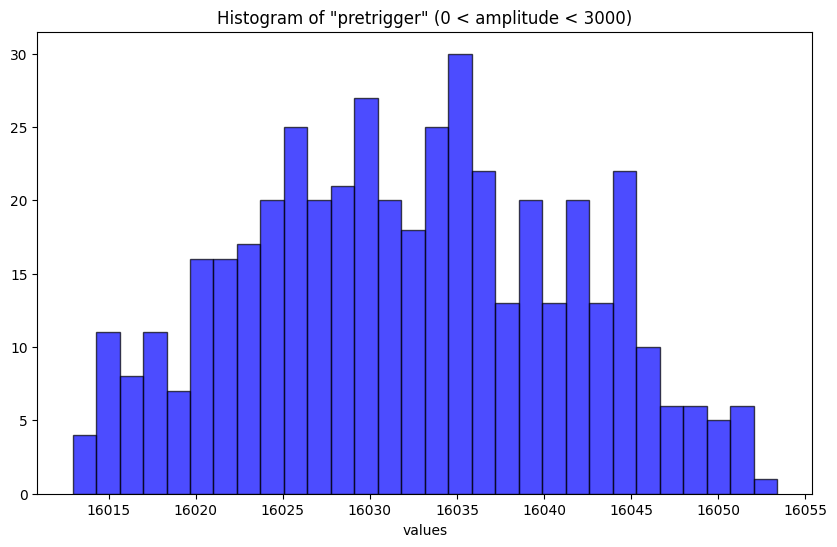

In [33]:
# 1D histogram

values = []

param = 'pretrigger'

for event in fit_params:
    #print(fit_params[event]['amp1'])
    if (0 < fit_params[event]['amp1'] < 3000 and fit_params[event]['pretrigger']>16010):
        values.append(fit_params[event]['pretrigger'])

plt.figure(figsize=(10, 6))
plt.hist(values, bins=30, color='blue', edgecolor='black', alpha=0.7)
plt.title('Histogram of "'+param+'" (0 < amplitude < 3000)')
plt.xlabel('values')
plt.show()
    

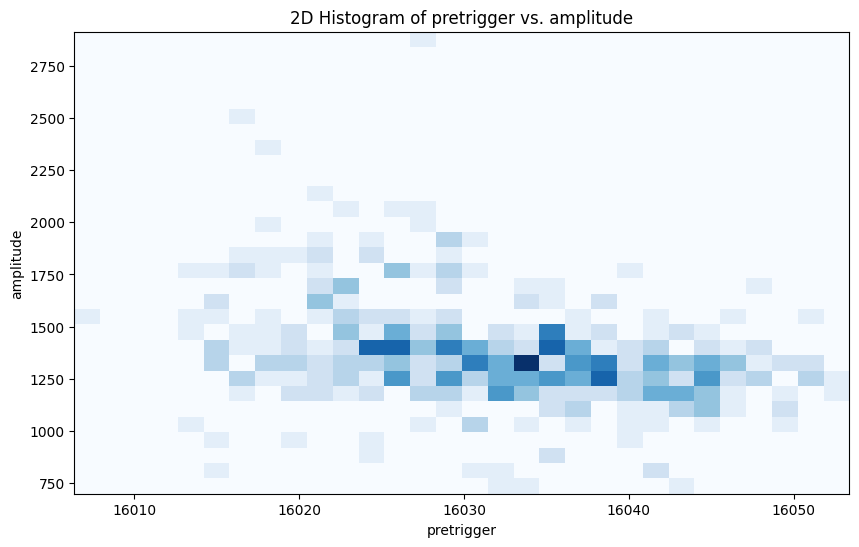

In [27]:
# 2D histogram

values_a = []
values_b = []

param_a = 'pretrigger'
param_b = 'amplitude'

for event in fit_params:
    #print(fit_params[event]['amp1'])
    if (0 < fit_params[event]['amp1'] < 3000 and fit_params[event]['pretrigger']>16000):
        values_a.append(fit_params[event]['pretrigger'])
        values_b.append(fit_params[event]['amp1'])

plt.figure(figsize=(10, 6))
plt.hist2d(values_a, values_b, bins=30, cmap='Blues')
plt.title('2D Histogram of '+param_a +' vs. ' + param_b)
plt.xlabel(param_a)
plt.ylabel(param_b)
plt.show()

In [34]:
print (*popt)

1393.2857223701208 3.654382153095881e-05 0.00027954080882801536 32714.15420162526 16026.622808911767


In [35]:
#fit_params[351083]

print(*popt)

1393.2857223701208 3.654382153095881e-05 0.00027954080882801536 32714.15420162526 16026.622808911767


/lscratch/yanliu/tmp/ipykernel_647226/7762413.py:5: RuntimeWarning: overflow encountered in exp
  y = np.where(x <= pretrigger, baseline, -(amp1 * np.exp(-(x-pretrigger) / t1 /samplerate) - amp1 * np.exp(-(x-pretrigger) / t2/samplerate)) + baseline)
/lscratch/yanliu/tmp/ipykernel_647226/7762413.py:5: RuntimeWarning: overflow encountered in multiply
  y = np.where(x <= pretrigger, baseline, -(amp1 * np.exp(-(x-pretrigger) / t1 /samplerate) - amp1 * np.exp(-(x-pretrigger) / t2/samplerate)) + baseline)


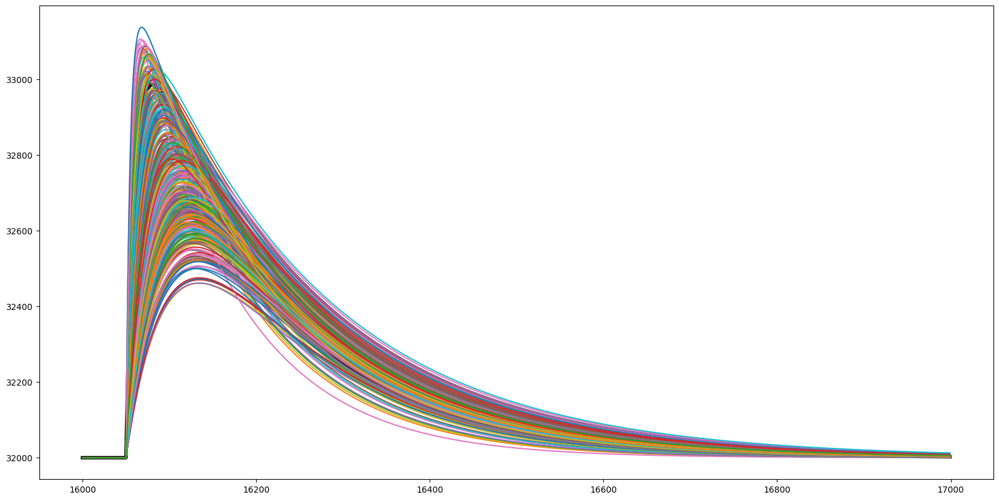

In [36]:
# plot how the pulses look like

plt.figure(figsize=(20, 10))

low_bound = 16000
up_bound = 17000

for event in fit_params:
    if (0 < fit_params[event]['amp1'] < 3000 and fit_params[event]['pretrigger']>16010):
        fit_array = list(fit_params[event].values())
        #print (*fit_array)
        # set amplitudes to the same - one choice of normalization
        fit_array[0] = 1300
        # set baseline to the same
        fit_array[3] = 32000
        #set pre-trigger offset to the same
        fit_array[4] = 16050
        plt.plot(time[low_bound:up_bound], two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])
        #if (event == 84112 or event == 190309 or event == 351083):
        #    plt.plot(time[low_bound:up_bound], two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])
        if (event == 264107):
            plt.plot(time[low_bound:up_bound], two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound], color = 'black', linewidth=4)

plt.yscale('linear')

In [37]:
for event in fit_params:
    if (0 < fit_params[event]['amp1'] < 3000 and fit_params[event]['pretrigger']>16010):
        #if (fit_params[event]['t1']> 8e-5):
            #print(event, fit_params[event])
            # event 84112 (triggerID) has the highest rise time
        #if (fit_params[event]['t1']<1.5e-5):
        #    print(event, fit_params[event])
            #event 190309 (triggerID) has the lowest rise time
        #if (fit_params[event]['t2']>0.0003):
            #print(event, fit_params[event])
            #event 351083 (triggerID) has the highest fall time
        if (4e-5<fit_params[event]['t1']<5e-5 and 0.00027<fit_params[event]['t2']<0.00028):
            print(event, fit_params[event])
            #event 169726 or 169730

# These 3 events will be my NxM template.

7265 {'amp1': 1320.055231945536, 't1': 4.7745102263382927e-05, 't2': 0.00027143008883595473, 'baseline': 32702.165680724993, 'pretrigger': 16034.585272678889}
77273 {'amp1': 1402.2618031011848, 't1': 4.1544490629963076e-05, 't2': 0.0002768258161254097, 'baseline': 32706.889905302818, 'pretrigger': 16031.591821770133}
77282 {'amp1': 1402.2618031011848, 't1': 4.1544490629963076e-05, 't2': 0.0002768258161254097, 'baseline': 32706.889905302818, 'pretrigger': 16031.591821770133}
31739 {'amp1': 1446.9164805307537, 't1': 4.876361933783701e-05, 't2': 0.00027849155771292653, 'baseline': 32771.26416661623, 'pretrigger': 16022.247310320496}
79181 {'amp1': 1374.5288947897366, 't1': 4.484721492460581e-05, 't2': 0.00027634750175829656, 'baseline': 32702.90531267221, 'pretrigger': 16026.666441161751}
92255 {'amp1': 1334.924964856794, 't1': 4.9473940050256115e-05, 't2': 0.00027949319116829887, 'baseline': 32707.090928382844, 'pretrigger': 16027.430821927597}
260589 {'amp1': 1361.6084233136592, 't1': 4

# Define chisq in time domain

In [38]:
# define a function to calculate the chisq

# note that you can set template d and e to 0, I think, to make it 3 
def chi_squared(params, data, templates):
    # Unpack the parameters for scaling the templates
    amp_a, amp_b, amp_c = params
    
    # Construct the model by combining the templates with the given scales
    model = (amp_a * templates['template_a'] +
             amp_b * templates['template_b'] +
             amp_c * templates['template_c']
             )
    
    # Calculate the chi-squared statistic
    chi2 = np.sum((data - model) ** 2)
    
    return chi2

# PCA to derive the templates

In [39]:
### The cell below only need to run once

In [40]:

#prepare data in the form that PCA needs
dataset = []

low_bound=0
up_bound=32768

i = 0
for event in fit_params:
    #if (i>3):
    #    break
    if (0 < fit_params[event]['amp1'] < 3000 and fit_params[event]['pretrigger']>16010):
        fit_array = list(fit_params[event].values())
        #print (*fit_array)
        # set amplitudes to the same - one choice of normalization
        fit_array[0] = 1300
        # set baseline to the same
        fit_array[3] = 1000
        #set pre-trigger offset to the same
        fit_array[4] = 16050
        dataset.append(list(two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound]))
    #i +=1
        
dataset_array = np.array(dataset)

print (dataset_array)

####!!!!
####need to write out to a file to run PCA because this current jupyter notebook has consumed too much memory somehow!
####Save the array to a file in binary format
np.save('./dataset_array.npy', dataset_array)

/lscratch/yanliu/tmp/ipykernel_647226/7762413.py:5: RuntimeWarning: overflow encountered in exp
  y = np.where(x <= pretrigger, baseline, -(amp1 * np.exp(-(x-pretrigger) / t1 /samplerate) - amp1 * np.exp(-(x-pretrigger) / t2/samplerate)) + baseline)
/lscratch/yanliu/tmp/ipykernel_647226/7762413.py:5: RuntimeWarning: overflow encountered in multiply
  y = np.where(x <= pretrigger, baseline, -(amp1 * np.exp(-(x-pretrigger) / t1 /samplerate) - amp1 * np.exp(-(x-pretrigger) / t2/samplerate)) + baseline)


[[1000. 1000. 1000. ... 1000. 1000. 1000.]
 [1000. 1000. 1000. ... 1000. 1000. 1000.]
 [1000. 1000. 1000. ... 1000. 1000. 1000.]
 ...
 [1000. 1000. 1000. ... 1000. 1000. 1000.]
 [1000. 1000. 1000. ... 1000. 1000. 1000.]
 [1000. 1000. 1000. ... 1000. 1000. 1000.]]


In [37]:
#Load file that contains the pulses.

# Load the array from a binary file
#dataset_array = np.load('./dataset_array.npy')
#print("Loaded Array:\n", dataset_array)

In [52]:
max_components=50

res = PCA(max_components,svd_solver='full').fit(dataset_array)
PCtot = res.components_
perc_vartot = res.explained_variance_ratio_

#save the file....
np.save('perc_vartot.npy', perc_vartot)

In [53]:
#PCtot = np.load('./PCtot.npy')
#perc_vartot = np.load('./perc_vartot.npy')

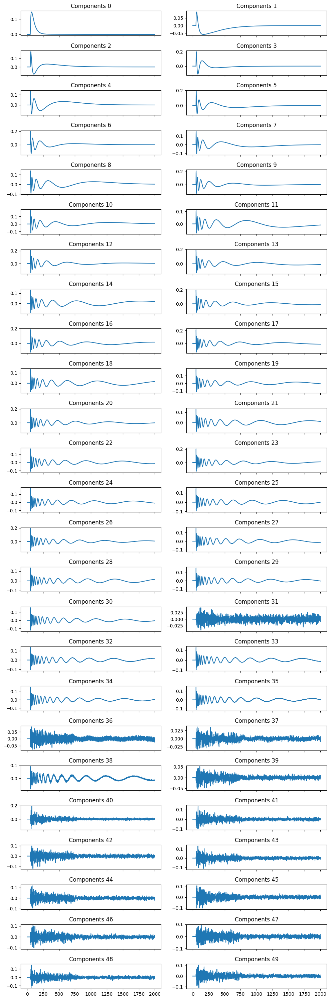

In [54]:
fig, ax = plt.subplots(nrows=25, ncols=2, figsize=(10, 30), sharex=True)
ax = ax.flatten()

for i,comp in enumerate(PCtot):
    ax[i].plot(comp[16000:18000])
    ax[i].set_title(f"Components {i}")
plt.tight_layout()
plt.show()

Text(0.5, 0, 'Component')

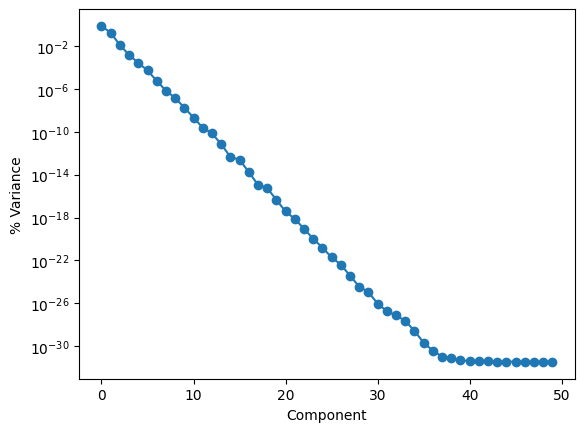

In [55]:
plt.plot(perc_vartot,'o-')
plt.yscale('log')
plt.ylabel('% Variance')
plt.xlabel('Component')

# Load these as templates

In [149]:
templates = {}


templates['template_a'] = PCtot[0][low_bound:up_bound]
templates['template_b'] = PCtot[1][low_bound:up_bound]
templates['template_c'] = PCtot[2][low_bound:up_bound]
templates['template_d'] = PCtot[3][low_bound:up_bound]
templates['template_e'] = PCtot[4][low_bound:up_bound]
#templates['template_f'] = PCtot[5][low_bound:up_bound]
#templates['template_g'] = PCtot[6][low_bound:up_bound]


templates

{'template_a': array([-1.19103165e-16,  1.29521933e-16,  3.70589163e-17, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]),
 'template_b': array([-3.03370112e-17, -1.93488521e-16, -1.24922429e-16, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00]),
 'template_c': array([ 7.59715856e-17,  7.22530015e-17, -8.51966690e-17, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00]),
 'template_d': array([-6.55843868e-16, -4.62935867e-16,  1.33868171e-16, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]),
 'template_e': array([-6.13475150e-16, -1.01425094e-15,  2.43077457e-16, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00])}

In [150]:
# Redefine here for convenience
# define a function to calculate the chisq

# note that you can set template d and e to 0, I think, to make it 3 
def chi_squared(params, data, templates):
    # Unpack the parameters for scaling the templates
    amp_a, amp_b, amp_c, amp_d, amp_e = params
    
    # Construct the model by combining the templates with the given scales
    model = (amp_a * templates['template_a'] +
             amp_b * templates['template_b'] +
             amp_c * templates['template_c'] +
             amp_d * templates['template_d'] +
             amp_e * templates['template_e']
             )
    
    # Calculate the chi-squared statistic
    chi2 = np.sum((data - model) ** 2)
    
    return chi2

In [151]:
# Let's look at one event
fit_array = list(fit_params[7265].values())
# set baseline to 0
fit_array[3] = 0
#set pre-trigger offset to the same - I AM NOT SURE IF I SHOULD SET TIME OFFSET TO THE SAME
fit_array[4] = 16050

data = np.array(two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])  # Your pulse data

In [152]:
# minimization
from scipy.optimize import minimize

initial_params = [1.0, 1.0, 1.0, 1.0, 1.0]

result = minimize(chi_squared, initial_params, args=(data, templates), method='L-BFGS-B')

# Extract the best-fit parameters
best_fit_params = result.x
print(f"Best-fit parameters: amp_a = {best_fit_params[0]}, amp_b = {best_fit_params[1]}, amp_c = {best_fit_params[2]}")
chi2 = chi_squared(best_fit_params, data, templates)
print(f"chisq value is {chi2}")

Best-fit parameters: amp_a = 6415.359153124519, amp_b = -6448.802737523631, amp_c = -300.80714882164875
chisq value is 52988.11103873588


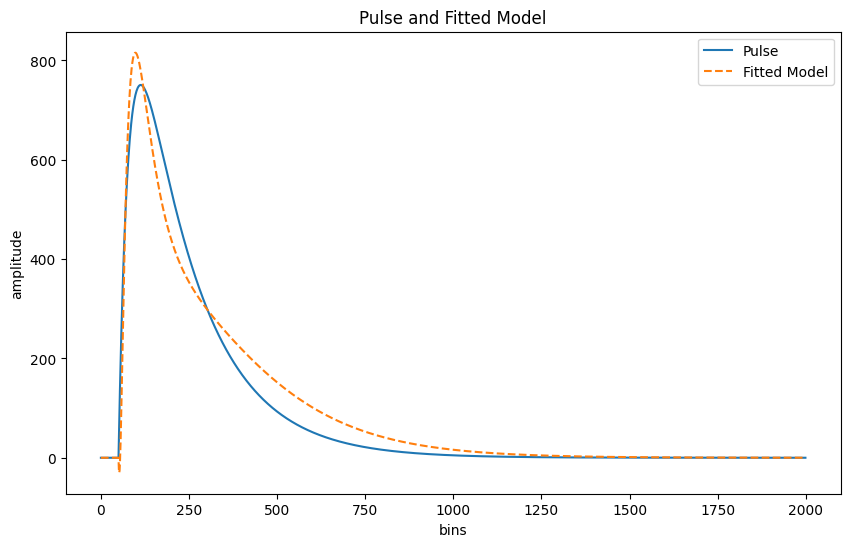

In [153]:
# visualization
fitted_model = (best_fit_params[0] * templates['template_a'] +
                best_fit_params[1] * templates['template_b'] +
                best_fit_params[2] * templates['template_c'])

# Plot the pulse and the fitted model
plt.figure(figsize=(10, 6))
plt.plot(data[16000:18000], label='Pulse')
plt.plot(fitted_model[16000:18000], label='Fitted Model', linestyle='--')
plt.legend()
plt.xlabel('bins')
plt.ylabel('amplitude')
plt.title('Pulse and Fitted Model')
plt.show()

In [154]:
# loop

fit_result = {}

i = 0
for event in fit_params:
    if (i>5):
        break
    i += 0
    if (fit_params[event]['amp1'] <0 or fit_params[event]['amp1'] > 3000 and fit_params[event]['pretrigger']>16010):
        continue
    fit_array = list(fit_params[event].values())
    # set baseline to 0
    fit_array[3] = 0
    #set pre-trigger offset to the same - I AM NOT SURE IF I SHOULD SET TIME OFFSET TO THE SAME
    fit_array[4] = 16050

    data = np.array(two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])  # Your pulse data

    initial_params = [1.0, 1.0, 1.0, 1.0, 1.0]

    result = minimize(chi_squared, initial_params, args=(data, templates), method='L-BFGS-B')

    # Extract the best-fit parameters
    best_fit_params = result.x
    print(f"Best-fit parameters: amp_a = {best_fit_params[0]}, amp_b = {best_fit_params[1]}, amp_c = {best_fit_params[2]}")
    print(f"amp_d = {best_fit_params[3]}, amp_e = {best_fit_params[4]}")

    chi2 = chi_squared(best_fit_params, data, templates)
    print(f"chisq value is {chi2}")

    #if (chi2>10000):
    #    continue
    
    fit_result[event] = {
        'chi2': chi2,
        'amp_a': best_fit_params[0],
        'amp_b': best_fit_params[1],
        'amp_c': best_fit_params[2],
        'amp_d': best_fit_params[3],
        'amp_e': best_fit_params[4]

    }
    
    # visualization
    fitted_model = (best_fit_params[0] * templates['template_a'] +
                    best_fit_params[1] * templates['template_b'] +
                    best_fit_params[2] * templates['template_c'] +
                    best_fit_params[3] * templates['template_d'] +
                    best_fit_params[4] * templates['template_e'])


    # Plot the pulse and the fitted model
    #plt.figure(figsize=(10, 6))
    #plt.plot(data[16000:18000], label='Pulse')
    #plt.plot(fitted_model[16000:18000], label='Fitted Model', linestyle='--')
    #plt.legend()
    #plt.xlabel('bins')
    #plt.ylabel('amplitude')
    #plt.title('Pulse and Fit comparison for ' + str(event))
    #plt.show()

Best-fit parameters: amp_a = 5216.369180809919, amp_b = -6018.534097655498, amp_c = -80.16404983852284
amp_d = 1121.569998357245, amp_e = -968.4064628352472
chisq value is 49776.84660722712
Best-fit parameters: amp_a = 10337.147321491135, amp_b = -4272.836164253094, amp_c = -142.7246080930525
amp_d = 1374.8617796883561, amp_e = -1069.1469279807663
chisq value is 54968.97325470377
Best-fit parameters: amp_a = 4563.687364438529, amp_b = -5796.354406447964, amp_c = 48.91996583292314
amp_d = 1095.2817301512302, amp_e = -1028.55279758421
chisq value is 62095.63576159609
Best-fit parameters: amp_a = 11027.565600676482, amp_b = -7596.007500859285, amp_c = -388.20496636593964
amp_d = 1385.9454200758323, amp_e = -1319.149747252334
chisq value is 98518.58850778779


/lscratch/yanliu/tmp/ipykernel_647226/7762413.py:5: RuntimeWarning: overflow encountered in exp
  y = np.where(x <= pretrigger, baseline, -(amp1 * np.exp(-(x-pretrigger) / t1 /samplerate) - amp1 * np.exp(-(x-pretrigger) / t2/samplerate)) + baseline)
/lscratch/yanliu/tmp/ipykernel_647226/7762413.py:5: RuntimeWarning: overflow encountered in multiply
  y = np.where(x <= pretrigger, baseline, -(amp1 * np.exp(-(x-pretrigger) / t1 /samplerate) - amp1 * np.exp(-(x-pretrigger) / t2/samplerate)) + baseline)


Best-fit parameters: amp_a = 1.0, amp_b = 1.0, amp_c = 1.0
amp_d = 1.0, amp_e = 1.0
chisq value is 2.9897314900364847e+20
Best-fit parameters: amp_a = 8490.10301985993, amp_b = -6723.537321758813, amp_c = -342.05089655392817
amp_d = 1156.7049217101926, amp_e = -1043.761830048713
chisq value is 66249.24100562156
Best-fit parameters: amp_a = 5114.223169741183, amp_b = -6184.558599684733, amp_c = 8.543251015904634
amp_d = 1130.9036433647245, amp_e = -1005.0662897329968
chisq value is 55093.98240223687
Best-fit parameters: amp_a = 8481.673789249493, amp_b = -8110.515578333279, amp_c = -473.23832098278643
amp_d = 1540.1560134446593, amp_e = -1265.4270158669815
chisq value is 86636.23680208954
Best-fit parameters: amp_a = 4297.992500681789, amp_b = -5135.316524032725, amp_c = -77.92181140043657
amp_d = 1016.5984901801994, amp_e = -911.9882800683927
chisq value is 46383.57288623121
Best-fit parameters: amp_a = 1.0, amp_b = 1.0, amp_c = 1.0
amp_d = 1.0, amp_e = 1.0
chisq value is 2.65654901959

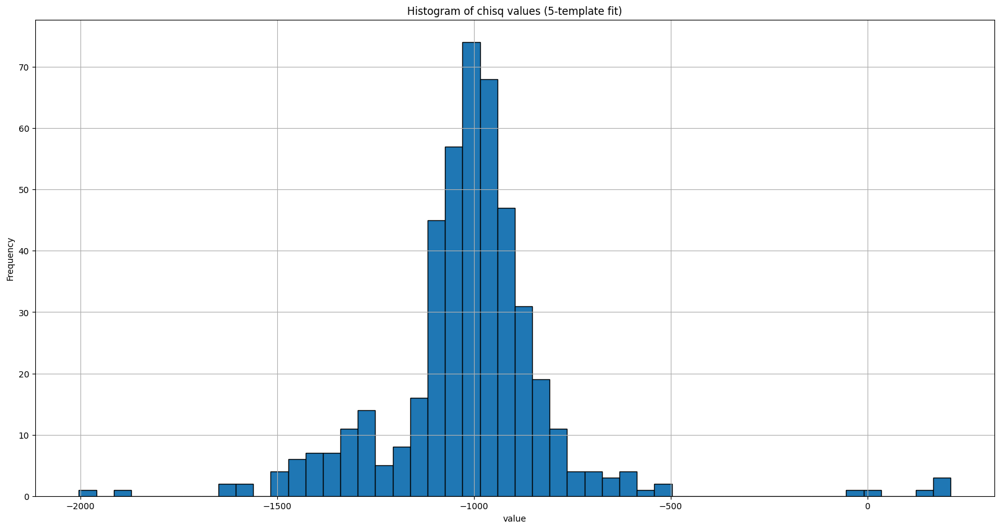

In [162]:
#values = [result['chi2'] for result in fit_result.values()]
values = [result['amp_e'] for result in fit_result.values() if result['chi2']<200000]

# Plot histogram of chi2 values
plt.figure(figsize=(20, 10))
plt.hist(values, bins=50, edgecolor='black')
plt.xlabel('value')
plt.ylabel('Frequency')
plt.title('Histogram of chisq values (5-template fit)')
plt.grid(True)
plt.show()

# These 3 events will be my NxM template.

### I will write a time domain chisq minimization to see if the sum of 3 templates can describe other pulse shapes 

first set of templates:
84112, 190309, 351083 (does not fit most pulses)

Second set of templates:
84112, 190309, 169730 (only ~10 events have a visibly bad fit)

Third set of templates:
104205, 190309, 169730 (many pulses aren't fit well)

Fourth set of templates:
84112, 190309, 147124


In [ ]:
# create a template dictionary to include the 3 templates
events_to_include = [147124, 190309, 169730]
template_params = {event: fit_params[event] for event in events_to_include if event in fit_params}
template_params

In [ ]:
plt.figure(figsize=(20, 10))

low_bound = 0
up_bound = 32768

templates = {}
for event in template_params:
    fit_array = list(fit_params[event].values())
    # set baseline to 0
    fit_array[0] = 1300
    # set baseline to 0
    fit_array[3] = 0
    #set pre-trigger offset to the same - I AM NOT SURE IF I SHOULD SET TIME OFFSET TO THE SAME
    fit_array[4] = 16050
    plt.plot(time[low_bound:up_bound], two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])
    #print (two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])
    #hardcode a bit
    if (event == 147124):
        templates['template_a'] = np.array(two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])
    if (event == 190309):
        templates['template_b'] = np.array(two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])
    if (event == 169730):
        templates['template_c'] = np.array(two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])
#templates

In [ ]:
#templates['template_b']

for event in fit_params:
    print (event)



In [ ]:
# Let's look at one event
fit_array = list(fit_params[121305].values())
# set baseline to 0
fit_array[3] = 0
#set pre-trigger offset to the same - I AM NOT SURE IF I SHOULD SET TIME OFFSET TO THE SAME
fit_array[4] = 16050

data = np.array(two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])  # Your pulse data

In [ ]:
# minimization
from scipy.optimize import minimize

initial_params = [1.0, 1.0, 1.0]

result = minimize(chi_squared, initial_params, args=(data, templates), method='L-BFGS-B')

# Extract the best-fit parameters
best_fit_params = result.x
print(f"Best-fit parameters: amp_a = {best_fit_params[0]}, amp_b = {best_fit_params[1]}, amp_c = {best_fit_params[2]}")
chi2 = chi_squared(best_fit_params, data, templates)
print(f"chisq value is {chi2}")

In [ ]:
# visualization
fitted_model = (best_fit_params[0] * templates['template_a'] +
                best_fit_params[1] * templates['template_b'] +
                best_fit_params[2] * templates['template_c'])

# Plot the pulse and the fitted model
plt.figure(figsize=(10, 6))
plt.plot(data[500:1500], label='Pulse')
plt.plot(fitted_model[500:1500], label='Fitted Model', linestyle='--')
plt.legend()
plt.xlabel('bins')
plt.ylabel('amplitude')
plt.title('Pulse and Fitted Model')
plt.show()

print ("data: ", fit_array)
print ("template rise time: ", template_params[84112]['t1'], template_params[190309]['t1'], template_params[147124]['t1'])
print ("template fall time: ", template_params[84112]['t2'], template_params[190309]['t2'], template_params[147124]['t2'])

# Now do things in a loop

In [ ]:
fit_result = {}

for event in fit_params:
    if (fit_params[event]['amp1'] <0 or fit_params[event]['amp1'] > 3000):
        continue
    fit_array = list(fit_params[event].values())
    # set baseline to 0
    fit_array[3] = 0
    #set pre-trigger offset to the same - I AM NOT SURE IF I SHOULD SET TIME OFFSET TO THE SAME
    fit_array[4] = 16050

    data = np.array(two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])  # Your pulse data

    initial_params = [1.0, 1.0, 1.0]

    result = minimize(chi_squared, initial_params, args=(data, templates), method='L-BFGS-B')

    # Extract the best-fit parameters
    best_fit_params = result.x
    print(f"Best-fit parameters: amp_a = {best_fit_params[0]}, amp_b = {best_fit_params[1]}, amp_c = {best_fit_params[2]}")
    chi2 = chi_squared(best_fit_params, data, templates)
    print(f"chisq value is {chi2}")

    #if (chi2>10000):
    #    continue
    
    fit_result[event] = {
        'chi2': chi2,
        'amp_a': best_fit_params[0],
        'amp_b': best_fit_params[1],
        'amp_c': best_fit_params[2]
    }
    
    # visualization
    fitted_model = (best_fit_params[0] * templates['template_a'] +
                    best_fit_params[1] * templates['template_b'] +
                    best_fit_params[2] * templates['template_c'])

    # Plot the pulse and the fitted model
    plt.figure(figsize=(10, 6))
    plt.plot(data[500:1500], label='Pulse')
    plt.plot(fitted_model[500:1500], label='Fitted Model', linestyle='--')
    plt.legend()
    plt.xlabel('bins')
    plt.ylabel('amplitude')
    plt.title('Pulse and Fit comparison for ' + str(event))
    plt.show()

    #print ("data: ", fit_array)
    #print ("template rise time: ", template_params[84112]['t1'], template_params[190309]['t1'], template_params[169730]['t1'])
    #print ("template fall time: ", template_params[84112]['t2'], template_params[190309]['t2'], template_params[169730]['t2'])

In [ ]:
fit_result

In [ ]:
#for result in fit_result:
#    print (result)

In [ ]:
values = [result['chi2'] for result in fit_result.values()]
#values = [result['chi2'] for result in fit_result.values() if result['chi2']<5000]

# Plot histogram of chi2 values
plt.figure(figsize=(20, 10))
plt.hist(values, bins=20, edgecolor='black')
plt.xlabel('value')
plt.ylabel('Frequency')
plt.title('Histogram of values')
plt.grid(True)
plt.show()

In [ ]:
eventIDs = [result for result in fit_result if fit_result[result]['chi2']>50000]
print (*eventIDs)

In [ ]:
# plot how the pulses look like

plt.figure(figsize=(20, 10))

low_bound = 16000
up_bound = 16500

eventIDs = [result for result in fit_result if fit_result[result]['chi2']>50000]

for eventID in eventIDs:
    if (0 < fit_params[eventID]['amp1'] < 3000):
        fit_array = list(fit_params[eventID].values())
        #print (*fit_array)
        # set amplitudes to the same - one choice of normalization
        fit_array[0] = 1300
        # set baseline to the same
        fit_array[3] = 32000
        #set pre-trigger offset to the same
        fit_array[4] = 16050
        plt.plot(time[low_bound:up_bound], two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound], color='blue')
        #if (event == 84112 or event == 190309 or event == 351083):
        #    plt.plot(time[low_bound:up_bound], two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])

#-----------------------------------------------------------------

eventIDs = [result for result in fit_result if fit_result[result]['chi2']<50000]

for eventID in eventIDs:
    if (0 < fit_params[eventID]['amp1'] < 3000):
        fit_array = list(fit_params[eventID].values())
        #print (*fit_array)
        # set amplitudes to the same - one choice of normalization
        fit_array[0] = 1300
        # set baseline to the same
        fit_array[3] = 32000
        #set pre-trigger offset to the same
        fit_array[4] = 16050
        plt.plot(time[low_bound:up_bound], two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound], color='red')
        #if (event == 84112 or event == 190309 or event == 351083):
        #    plt.plot(time[low_bound:up_bound], two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound])


#------------------------------------------------------------------

fit_array = list(fit_params[110069].values())
#print (*fit_array)
# set amplitudes to the same - one choice of normalization
fit_array[0] = 1300
# set baseline to the same
fit_array[3] = 32000
#set pre-trigger offset to the same
fit_array[4] = 16050
plt.plot(time[low_bound:up_bound], two_exp_fit(np.arange(len(pulse['Pulse'])), *fit_array)[low_bound:up_bound], color='black', linewidth=4)



plt.yscale('linear')